In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import astropy
import matplotlib
from astropy.io import fits

In [2]:
data_path = '/sps/lsst/users/barcelin/data/'

## Import data from generated image: ellipticity measured with KSB method on noiseless images

In [3]:
test_sample = pd.read_csv(data_path+'TFP/GalSim_COSMOS/isolated_galaxies/centered/test/galaxies_isolated_20191024_0_data.csv')

In [4]:
test_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
nb_blended_gal               10000 non-null int64
SNR                          10000 non-null float64
SNR_peak                     10000 non-null float64
redshift                     10000 non-null float64
moment_sigma                 10000 non-null float64
e1                           10000 non-null float64
e2                           10000 non-null float64
mag                          10000 non-null float64
mag_ir                       10000 non-null float64
closest_x                    0 non-null float64
closest_y                    0 non-null float64
closest_redshift             0 non-null float64
closest_moment_sigma         0 non-null float64
closest_e1                   0 non-null float64
closest_e2                   0 non-null float64
closest_mag                  0 non-null float64
closest_mag_ir               0 non-null float64
blendedness_total_lsst       0 non-null fl

Text(0.5, 1.0, 'E2')

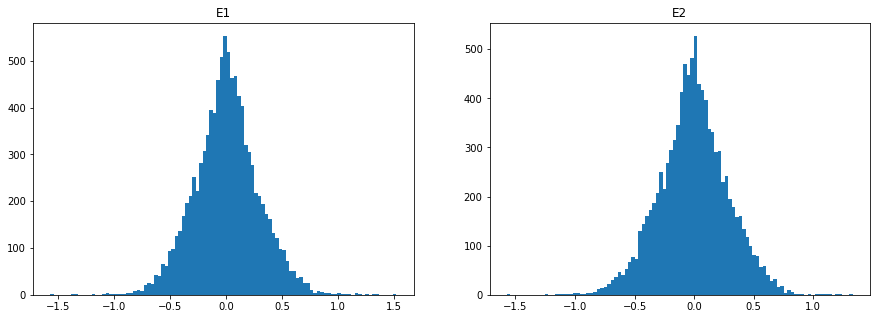

In [5]:
fig, axes = plt.subplots(1,2, figsize = (15,5))
_ = axes[0].hist(test_sample['e1'], bins = 100)
_ = axes[1].hist(test_sample['e2'], bins = 100)

axes[0].set_title('E1')
axes[1].set_title('E2')

## Import catalog

In [6]:
fitted_catalog = fits.open(data_path+'COSMOS_25.2_training_sample/real_galaxy_catalog_25.2_fits.fits')

In [7]:
fitted_catalog.info()

Filename: /sps/lsst/users/barcelin/data/COSMOS_25.2_training_sample/real_galaxy_catalog_25.2_fits.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     36   87798R x 14C   [J, D, D, D, 8D, 16D, 5J, D, D, D, J, J, 3D, 4D]   


## Verification of ellipticity for sersic fits

### E1 and E2 for sersic fits

In [8]:
sersicfit = fitted_catalog[1].data['SERSICFIT']
sersicfit.shape

(87798, 8)

In [9]:
e1_sersicfit = ( (1-sersicfit[:,3])/(1+sersicfit[:,3]) )*np.cos(2*sersicfit[:,7])
e2_sersicfit = ( (1-sersicfit[:,3])/(1+sersicfit[:,3]) )*np.sin(2*sersicfit[:,7])

In [10]:
e1_sersicfit.shape, np.min(e1_sersicfit), np.max(e1_sersicfit),  np.min(e2_sersicfit), np.max(e2_sersicfit)

((87798,),
 -0.9047251250400911,
 0.9047587260488782,
 -0.9044696524298673,
 0.8994936327863569)

Text(0.5, 1.0, 'E2')

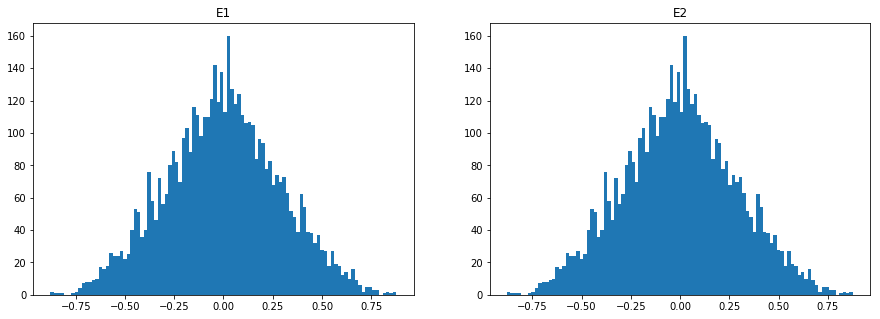

In [11]:
fig, axes = plt.subplots(1,2, figsize = (15,5))
_ = axes[0].hist(e1_sersicfit[:5000], bins = 100)
_ = axes[1].hist(e1_sersicfit[:5000], bins = 100)

axes[0].set_title('E1')
axes[1].set_title('E2')

### Mean absolute deviation between image and sersic model

In [12]:
meandev_sersicfit = fitted_catalog[1].data['FIT_MAD_S']
meandev_sersicfit.shape

(87798,)

In [13]:
print(e1_sersicfit[0] ,meandev_sersicfit[0])

0.05493919119883439 0.002050128135597444


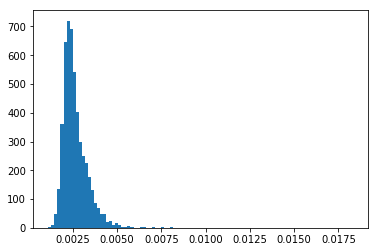

In [14]:
_ = plt.hist(meandev_sersicfit[:5000], bins = 100)

## Verification of ellipticity for bulge+disk fits

### E1 and E2 for bulge+disk fits

In [15]:
bulgefit = fitted_catalog[1].data['BULGEFIT']
bulgefit.shape

(87798, 16)

In [16]:
e1_bulgefit = np.zeros((87798))
e2_bulgefit = np.zeros((87798))
e1_bulgefit_bulge = np.zeros((87798))
e2_bulgefit_bulge = np.zeros((87798))
count = 0

for i in range (len(bulgefit)):
    if bulgefit[i,3] != -1:
        print('q : '+str((bulgefit[i,3], bulgefit[i,11])))
        print('angle : '+str((bulgefit[i,7], bulgefit[i,15])))
        e1_bulgefit[i] = ( (1-bulgefit[i,3])/(1+bulgefit[i,3]) )*np.cos(2*bulgefit[i,7])
        e2_bulgefit[i] = ( (1-bulgefit[i,3])/(1+bulgefit[i,3]) )*np.sin(2*bulgefit[i,7])
        e1_bulgefit_bulge[i] = ( (1-bulgefit[i,11])/(1+bulgefit[i,11]) )*np.cos(2*bulgefit[i,15])
        e2_bulgefit_bulge[i] = ( (1-bulgefit[i,11])/(1+bulgefit[i,11]) )*np.sin(2*bulgefit[i,15])
    else:
        print(str(i)+' : '+str(fitted_catalog[1].data['FIT_STATUS'][i])+' BulgeFit has failed')
        count+=1

q : (0.35810660534409483, 0.05)
angle : (0.7270218481984693, 0.8261436144591823)
q : (0.1918313329099096, 0.2221980677230616)
angle : (-0.653157535868493, -0.8580977101162014)
q : (0.522957039861028, 0.7425736875541024)
angle : (1.2527920705388156, 1.9695011915783498)
q : (0.47742376917101503, 0.05)
angle : (0.4776678844798884, 0.5284126159980042)
q : (0.4108763564472259, 0.07229035027436928)
angle : (0.6697314507484008, -1.7052708449727527)
q : (0.36603908299585436, 0.05)
angle : (0.9642978930979771, 1.7442607426307692)
q : (0.3083772956457872, 0.4197019346858572)
angle : (1.1697422074834591, 0.6071743951945785)
q : (0.4001773263332409, 0.10030018774237062)
angle : (0.2508139660865581, 0.7176431857570683)
q : (0.3908271538558906, 0.37449428413129005)
angle : (1.7378356944416777, -2.2242346318701234)
q : (0.29882866768471844, 0.6690266101610024)
angle : (2.030592035801245, 2.0732571742005086)
q : (0.35680447238225704, 0.0524911728272045)
angle : (2.225013141305689, 1.8705790540180123)


Ellipticity and angles are different for the bulge fit and for the disk fit. Why ?

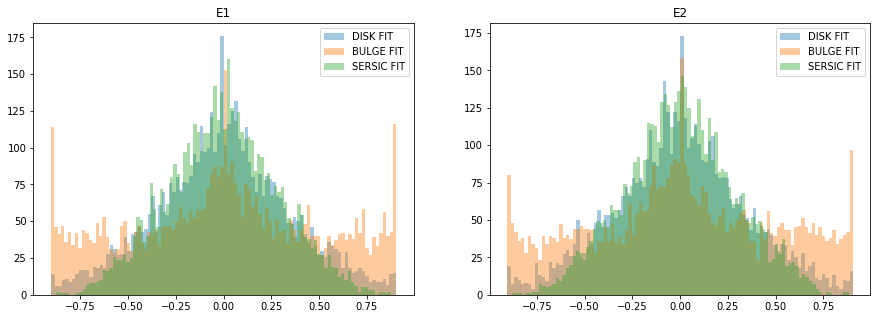

In [17]:
fig, axes = plt.subplots(1,2, figsize = (15,5))
_ = axes[0].hist(e1_bulgefit[:5000], bins = 100, alpha = 0.4, label = 'DISK FIT')
_ = axes[0].hist(e1_bulgefit_bulge[:5000], bins = 100, alpha = 0.4, label = 'BULGE FIT')
_ = axes[0].hist(e1_sersicfit[:5000], bins = 100, alpha = 0.4, label = 'SERSIC FIT')
_ = axes[1].hist(e2_bulgefit[:5000], bins = 100, alpha = 0.4, label = 'DISK FIT')
_ = axes[1].hist(e2_bulgefit_bulge[:5000], bins = 100, alpha = 0.4, label = 'BULGE FIT')
_ = axes[1].hist(e2_sersicfit[:5000], bins = 100, alpha = 0.4, label = 'SERSIC FIT')

axes[0].set_title('E1')
axes[1].set_title('E2')

axes[0].legend()
axes[1].legend()

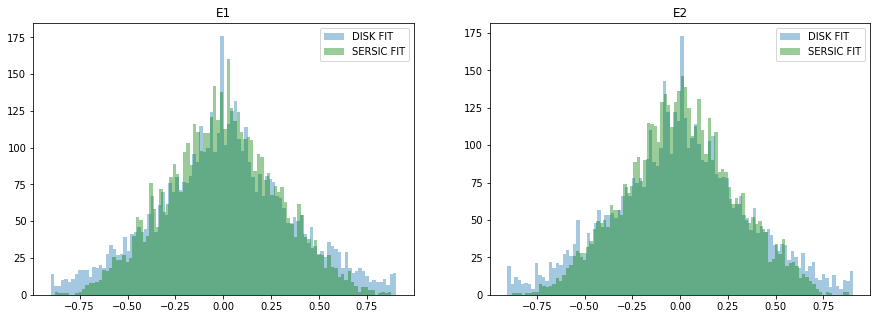

In [19]:
fig, axes = plt.subplots(1,2, figsize = (15,5))
_ = axes[0].hist(e1_bulgefit[:5000], bins = 100, alpha = 0.4, label = 'DISK FIT')
_ = axes[0].hist(e1_sersicfit[:5000], bins = 100, alpha = 0.4, label = 'SERSIC FIT', color ='g')
_ = axes[1].hist(e2_bulgefit[:5000], bins = 100, alpha = 0.4, label = 'DISK FIT')
_ = axes[1].hist(e2_sersicfit[:5000], bins = 100, alpha = 0.4, label = 'SERSIC FIT', color ='g')

axes[0].set_title('E1')
axes[1].set_title('E2')

axes[0].legend()
axes[1].legend()

### Mean absolute deviation between image and bulge + disk fits

In [20]:
meandev_bulgefit = fitted_catalog[1].data['FIT_MAD_B']
meandev_bulgefit.shape

(87798,)

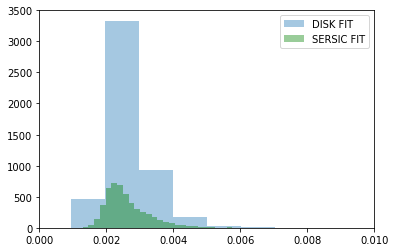

In [32]:
_ = plt.hist(meandev_bulgefit[:5000], bins = 1000, alpha = 0.4, label = 'DISK FIT')
_ = plt.hist(meandev_sersicfit[:5000], bins = 100, alpha = 0.4, label = 'SERSIC FIT', color = 'g')
plt.xlim(0,0.01)
plt.legend()

In [22]:
np.min(meandev_sersicfit[:5000]), np.min(meandev_bulgefit[:5000])

(0.0011168954753224183, 0.0009446139443162593)

In [23]:
np.max(meandev_sersicfit[:5000]),np.max(meandev_bulgefit[:5000])

(0.018310127779841423, 1.016498053002235)

In [24]:
np.where(meandev_bulgefit[:5000]>0.018)

(array([ 213,  246,  291,  322,  344,  370,  377,  544,  562,  581,  587,
         591,  805, 1024, 1086, 1152, 1250, 1411, 1414, 1646, 1648, 2009,
        2019, 2118, 2264, 2669, 2746, 2797, 2864, 2888, 2958, 2999, 3014,
        3023, 3153, 3174, 3270, 3348, 3448, 3592, 3678, 3707, 3730, 3898,
        3969, 3990, 4022, 4158, 4169, 4182, 4184, 4256, 4257, 4336, 4410,
        4459, 4637, 4727, 4835, 4841, 4884, 4896]),)

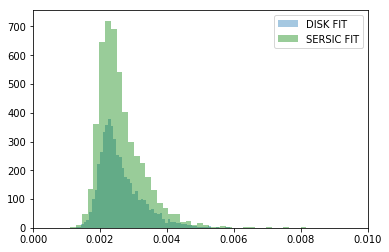

In [31]:
_ = plt.hist(np.delete(meandev_bulgefit[:5000],np.where(meandev_bulgefit[:5000]>0.018) ), bins = 100, alpha = 0.4, label = 'DISK FIT')
_ = plt.hist(meandev_sersicfit[:5000], bins = 100, alpha = 0.4, label = 'SERSIC FIT', color = 'g')
plt.xlim(0,0.01)
plt.legend()

In [26]:
counter_sersic_wins = 0
counter_sersic_losses = 0
mean_dev = 0
for i in range (len(meandev_bulgefit)):
    if meandev_bulgefit[i]>=meandev_sersicfit[i]:
        counter_sersic_wins +=1
    else:
        counter_sersic_losses +=1
        mean_dev += (meandev_sersicfit[i]-meandev_bulgefit[i])
        
print(counter_sersic_wins)
print(mean_dev/counter_sersic_losses)

41094
0.00014724401136525147


For 41 094 galaxies on the initial 87 798, the sersic fit is better or as good as the bulge+disk fit.

## Check FIT status to see if all fits have converged.

In [27]:
fit_status = fitted_catalog[1].data['FIT_STATUS']

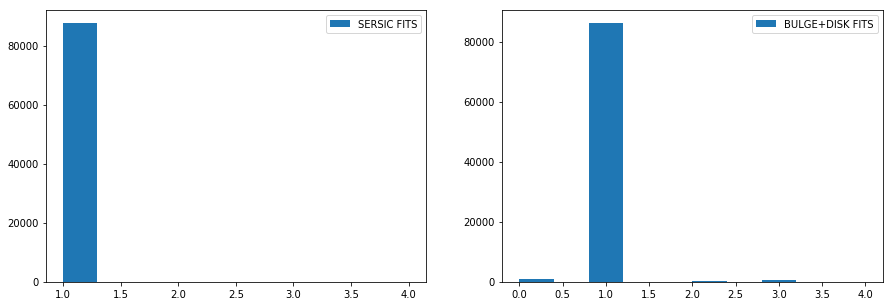

In [28]:
fig, axes = plt.subplots(1,2, figsize=(15,5))
_ = axes[0].hist(fit_status[:,4], label = 'SERSIC FITS')
_ = axes[1].hist(fit_status[:,0], label = 'BULGE+DISK FITS')
axes[0].legend()
axes[1].legend()

In [29]:
print(count)

840


All sersic fit have converged but clearly not all bulge+disk fits. 840 of bulge+disk fit have not converged.

## Comparison of KSB method and SERSIC FIT

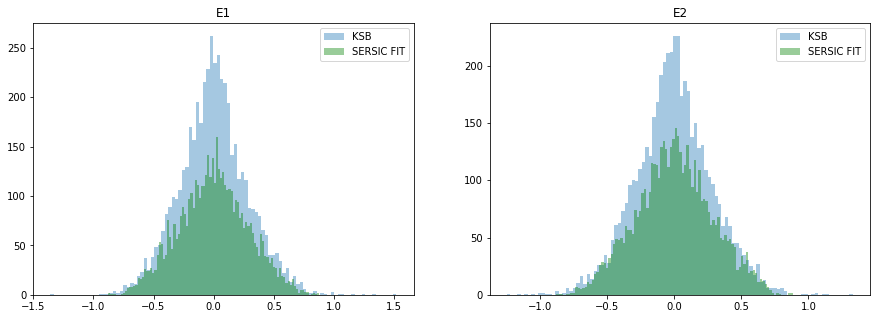

In [30]:
fig, axes = plt.subplots(1,2, figsize = (15,5))
_ = axes[0].hist(test_sample['e1'][:5000], bins = 100, alpha = 0.4, label = 'KSB')
_ = axes[0].hist(e1_sersicfit[:5000], bins = 100, alpha = 0.4, label = 'SERSIC FIT', color ='g')
_ = axes[1].hist(test_sample['e2'][:5000], bins = 100, alpha = 0.4, label = 'KSB')
_ = axes[1].hist(e2_sersicfit[:5000], bins = 100, alpha = 0.4, label = 'SERSIC FIT', color ='g')

axes[0].set_title('E1')
axes[1].set_title('E2')

axes[0].legend()
axes[1].legend()

## Comparison of KSB measure and fit value on generated sample

In [4]:
sample_test = pd.read_csv(data_path+'TFP/GalSim_COSMOS/test/test/galaxies_blended_20191024_0_data.csv')

In [7]:
sample_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 171 entries, redshift_0 to n_peak_detected
dtypes: float64(168), int64(3)
memory usage: 13.0 MB


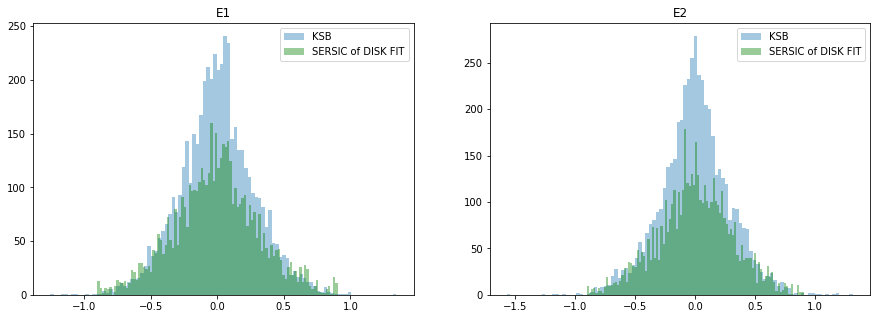

In [19]:
fig, axes = plt.subplots(1,2, figsize = (15,5))
_ = axes[0].hist(sample_test['e1_ksb_0'][:5000], bins = 100, alpha = 0.4, label = 'KSB')
_ = axes[0].hist(sample_test['e1_fit_0'][:5000], bins = 100, alpha = 0.4, label = 'SERSIC of DISK FIT', color ='g')
_ = axes[1].hist(sample_test['e2_ksb_0'][:5000], bins = 100, alpha = 0.4, label = 'KSB')
_ = axes[1].hist(sample_test['e2_fit_0'][:5000], bins = 100, alpha = 0.4, label = 'SERSIC of DISK FIT', color ='g')

axes[0].set_title('E1')
axes[1].set_title('E2')

axes[0].legend()
axes[1].legend()

Text(0.5, 1.0, 'E2')

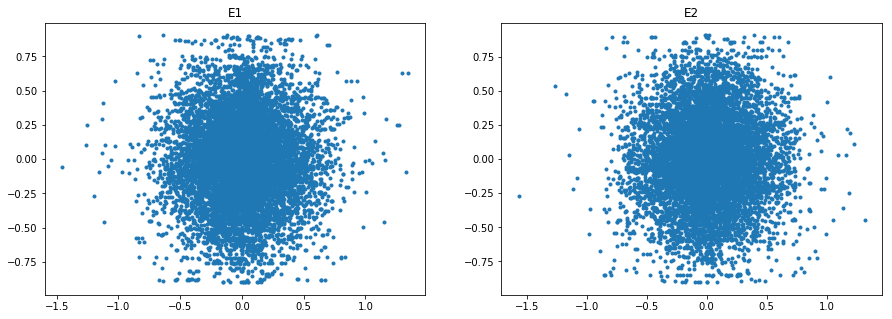

In [30]:
fig, axes = plt.subplots(1,2, figsize = (15,5))
axes[0].plot(sample_test['e1_ksb_0'], sample_test['e1_fit_0'], '.')
axes[1].plot(sample_test['e2_ksb_0'], sample_test['e2_fit_0'], '.')
axes[0].set_title('E1')
axes[1].set_title('E2')

Text(0.5, 1.0, 'E2')

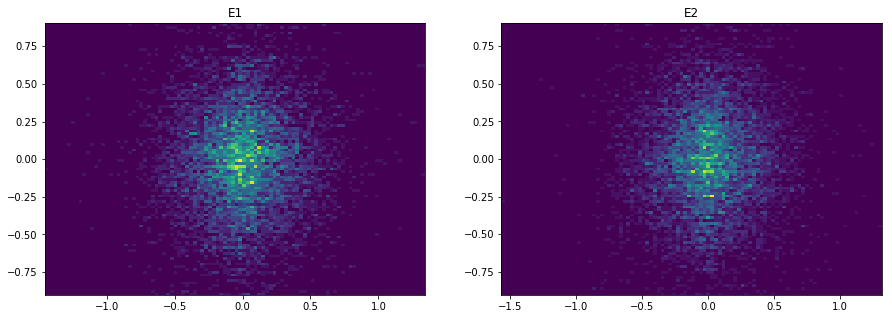

In [28]:
fig, axes = plt.subplots(1,2, figsize = (15,5))
axes[0].hist2d(sample_test['e1_ksb_0'], sample_test['e1_fit_0'], bins = 100)
axes[1].hist2d(sample_test['e2_ksb_0'], sample_test['e2_fit_0'], bins = 100)
axes[0].set_title('E1')
axes[1].set_title('E2')

## Test of some generations

In [3]:
test = np.load('/sps/lsst/users/barcelin/data/TFP/GalSim_COSMOS/test/training/galaxies_blended_20191024_0_images.npy', mmap_mode = 'c')

In [4]:
test.shape

(10000, 2, 10, 64, 64)

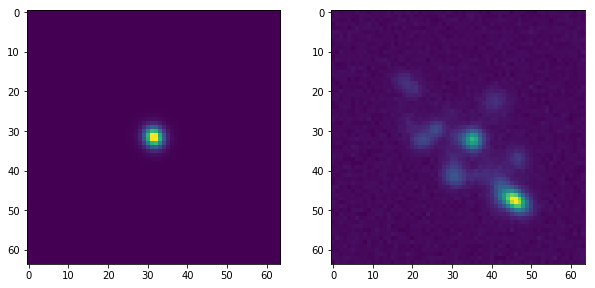

In [5]:
fig, axes = plt.subplots(1, 2, figsize =(10,5))
axes[0].imshow(test[0][0][6])
axes[1].imshow(test[0][1][6])

In [6]:
test = np.load('/sps/lsst/users/barcelin/data/test/test/galaxies_isolated_20191024_0_images.npy', allow_pickle=True)

In [7]:
test_data = pd.read_csv('/sps/lsst/users/barcelin/data/test/test/galaxies_isolated_20191024_0_data.csv')

In [8]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 19 columns):
redshift_0             10 non-null float64
moment_sigma_0         10 non-null float64
e1_ksb_0               10 non-null float64
e2_ksb_0               10 non-null float64
e1_fit_0               10 non-null float64
e2_fit_0               10 non-null float64
mag_0                  10 non-null float64
weight_fit_0           10 non-null float64
nb_blended_gal         10 non-null int64
SNR                    10 non-null float64
SNR_peak               10 non-null float64
mag                    10 non-null float64
mag_ir                 10 non-null float64
closest_x              0 non-null float64
closest_y              0 non-null float64
closest_mag            0 non-null float64
closest_mag_ir         0 non-null float64
idx_closest_to_peak    10 non-null int64
n_peak_detected        10 non-null int64
dtypes: float64(16), int64(3)
memory usage: 1.6 KB


In [9]:
test.shape, test[0,].shape

((10, 2), (2,))

In [10]:
phi_ksb = 1/2*np.arctan(test_data['e2_ksb_0']/test_data['e1_ksb_0']) # in radians
q_ksb = (1-np.sqrt(test_data['e2_ksb_0']**2+test_data['e1_ksb_0']**2))/(1+np.sqrt(test_data['e2_ksb_0']**2+test_data['e1_ksb_0']**2))

phi_fit = 1/2*np.arctan(test_data['e2_fit_0']/test_data['e1_fit_0']) # in radians
q_fit = (1-np.sqrt(test_data['e2_fit_0']**2+test_data['e1_fit_0']**2))/(1+np.sqrt(test_data['e2_fit_0']**2+test_data['e1_fit_0']**2))

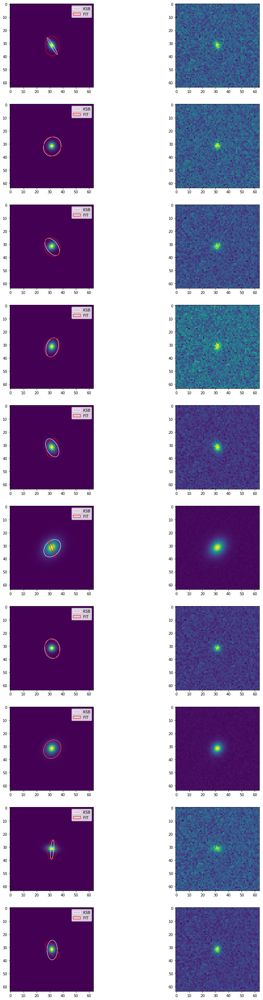

In [11]:
fig, axes = plt.subplots(10,2, figsize=(15,50))
for i in range (test.shape[0]):
    axes[i,0].imshow(test[i,0][0][6])
    axes[i,0].add_patch(matplotlib.patches.Ellipse((32, 32), width=q_ksb[i]*15, height=15, angle = phi_ksb[i]*180/np.pi,
                     edgecolor='white',
                     facecolor='none',
                     linewidth=1,
                     label = 'KSB'))
    axes[i,0].add_patch(matplotlib.patches.Ellipse((32, 32), width=q_fit[i]*15, height=15, angle = phi_fit[i]*180/np.pi,
                 edgecolor='red',
                 facecolor='none',
                 linewidth=1,
                 label = 'FIT'))
    axes[i,1].imshow(test[i,1][6])
    axes[i,0].legend()

In [41]:
test = np.load('/sps/lsst/users/barcelin/data/test_blend/test/galaxies_blended_20191024_0_images.npy', mmap_mode = 'c' )

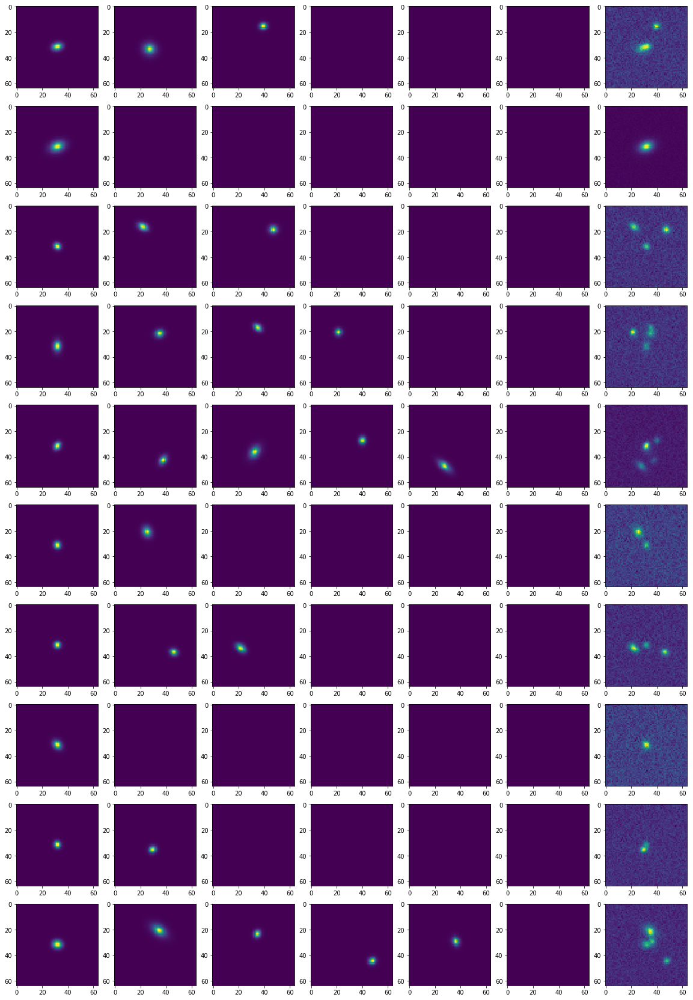

In [43]:
fig, axes = plt.subplots(10,7, figsize = (20,30))
for i in range (10):
    for j in range (7):
        axes[i,j].imshow(test[i,j,6])